<a href="https://colab.research.google.com/github/Jeremy26/hydranets_course/blob/main/MTL_Run_Py.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Welcome to the HydraNet Workshop 🐸🐸🐸
In this workshop, you're going to learn how to build a Neural Network that has:
* Input: **a monocular RGB Image**
* Output: **a Depth Map**, and **a Segmentation Map**

A single model, two different outputs. For that, out model will need to use a principle called Multi Task Learning.<p>

# 1 - Imports

In [1]:
!wget https://hydranets-data.s3.eu-west-3.amazonaws.com/hydranets-data.zip && unzip -q hydranets-data.zip && mv hydranets-data/* . && rm hydranets-data.zip && rm -rf hydranets-data

--2023-04-01 09:41:48--  https://hydranets-data.s3.eu-west-3.amazonaws.com/hydranets-data.zip
Résolution de hydranets-data.s3.eu-west-3.amazonaws.com (hydranets-data.s3.eu-west-3.amazonaws.com)… 52.95.155.40
Connexion à hydranets-data.s3.eu-west-3.amazonaws.com (hydranets-data.s3.eu-west-3.amazonaws.com)|52.95.155.40|:443… connecté.
requête HTTP transmise, en attente de la réponse… 200 OK
Taille : 110752264 (106M) [application/zip]
Sauvegarde en : « hydranets-data.zip »

hydranets-data.zip  100%[===================>] 105,62M  37,6MB/s    ds 2,8s    

2023-04-01 09:41:51 (37,6 MB/s) — « hydranets-data.zip » sauvegardé [110752264/110752264]



In [3]:
%matplotlib inline
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import cv2
import torch
import torch.nn as nn
import math
import torch.nn.functional as F
from torch.autograd import Variable

# 2 — Creating the HydraNet
We now have 2 DataLoaders: one for training, and one for validation/test. <p>

In the next step, we're going to define our model, following the paper [Real-Time Joint Semantic Segmentation and Depth Estimation Using Asymmetric Annotations](https://arxiv.org/pdf/1809.04766.pdf) —— If you haven't read it yet, now is the time.<p>

A Note — This notebook has been adapted from DrSleep, a researcher named Vladimir, who authorized me to adapt it for education purposes. [Here's the notebook I'm refering to](https://github.com/DrSleep/multi-task-refinenet/blob/master/src/notebooks/ExpNYUDKITTI_joint.ipynb/).

<p>

> ![](https://d3i71xaburhd42.cloudfront.net/435d4b5c30f10753d277848a17baddebd98d3c31/2-Figure1-1.png)

Our model takes an input RGB image, make it go through an encoder, a lightweight refinenet decoder, and then has 2 heads, one for each task.<p>
Things to note:
* The only **convolutions** we'll need will be 3x3 and 1x1
* We also need a **MaxPooling 5x5**
* **CRP-Blocks** are implemented as Skip-Connection Operations
* **Each Head is made of a 1x1 convolution followed by a 3x3 convolution**, only the data and the loss change there


## 2.1 — Create a HydraNet class

In [4]:
!wget https://hydranets-data.s3.eu-west-3.amazonaws.com/hydranet_builder.py

--2023-04-01 09:45:46--  https://hydranets-data.s3.eu-west-3.amazonaws.com/hydranet_builder.py
Résolution de hydranets-data.s3.eu-west-3.amazonaws.com (hydranets-data.s3.eu-west-3.amazonaws.com)… 52.95.156.86
Connexion à hydranets-data.s3.eu-west-3.amazonaws.com (hydranets-data.s3.eu-west-3.amazonaws.com)|52.95.156.86|:443… connecté.
requête HTTP transmise, en attente de la réponse… 200 OK
Taille : 6943 (6,8K) [text/x-python-script]
Sauvegarde en : « hydranet_builder.py.1 »

hydranet_builder.py 100%[===================>]   6,78K  --.-KB/s    ds 0,001s  

2023-04-01 09:45:46 (4,87 MB/s) — « hydranet_builder.py.1 » sauvegardé [6943/6943]



In [5]:
class HydraNet(nn.Module):
    def __init__(self):        
        #super(HydraNet, self).__init__() # Python2
        super().__init__() # Python 3
        self.num_tasks = 2
        self.num_classes = 6

In [6]:
hydranet = HydraNet()

## 2.2 — Defining the Encoder: A MobileNetv2
![](https://iq.opengenus.org/content/images/2020/11/conv_mobilenet_v2.jpg)

NOTE — In this mini-workshop, we won't build the MobileNet from scratch but we'll simply call a function. To learn the scratch techniques, [join the complete version](https://courses.thinkautonomous.ai/hydranets).

In [7]:
from hydranet_builder import define_mobilenet

HydraNet.define_mobilenet = define_mobilenet

In [8]:
hydranet.define_mobilenet()

In [9]:
print(hydranet)

HydraNet(
  (layer1): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU6(inplace=True)
  )
  (layer2): Sequential(
    (0): InvertedResidualBlock(
      (output): Sequential(
        (0): Sequential(
          (0): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU6(inplace=True)
        )
        (1): Sequential(
          (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
          (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU6(inplace=True)
        )
        (2): Sequential(
          (0): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affin

## 2.3 — Defining the Decoder - A Multi-Task Lighweight RefineNet
Paper: https://arxiv.org/pdf/1810.03272.pdf

![](https://d3i71xaburhd42.cloudfront.net/4d653b19ce1c7cba79fc2f11271fb90f7744c95c/4-Figure1-1.png)

In [10]:
from hydranet_builder import define_lightweight_refinenet, _make_crp
HydraNet._make_crp = _make_crp
HydraNet.define_lightweight_refinenet = define_lightweight_refinenet

In [11]:
hydranet.define_lightweight_refinenet()

## 2.4 — Define the HydraNet Forward Function

> ![](https://d3i71xaburhd42.cloudfront.net/435d4b5c30f10753d277848a17baddebd98d3c31/2-Figure1-1.png)

In [12]:
from hydranet_builder import forward

HydraNet.forward = forward

# 3 — Run the Model

## 3.1 — Load the Model Weights

In [13]:
if torch.cuda.is_available():
    _ = hydranet.cuda()
_ = hydranet.eval()

In [14]:
ckpt = torch.load('ExpKITTI_joint.ckpt')
hydranet.load_state_dict(ckpt['state_dict'])

<All keys matched successfully>

## 3.2 — Preprocess Images

In [15]:
IMG_SCALE  = 1./255
IMG_MEAN = np.array([0.485, 0.456, 0.406]).reshape((1, 1, 3))
IMG_STD = np.array([0.229, 0.224, 0.225]).reshape((1, 1, 3))

def prepare_img(img):
    return (img * IMG_SCALE - IMG_MEAN) / IMG_STD

## 3.3 — Load and Run an Image

In [16]:
# Pre-processing and post-processing constants #
CMAP = np.load('cmap_kitti.npy')
NUM_CLASSES = 6

In [17]:
print(CMAP)

[[128 128 128]
 [128   0   0]
 [128  64 128]
 [  0   0 192]
 [128 128   0]
 [ 64   0 128]
 [  0   0   0]]


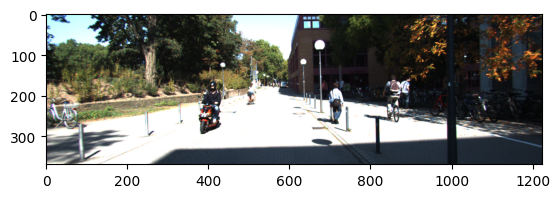

In [18]:
import glob
images_files = glob.glob('data/*.png')
idx = np.random.randint(0, len(images_files))

img_path = images_files[idx]
img = np.array(Image.open(img_path))
plt.imshow(img)
plt.show()

In [19]:
def pipeline(img):
    with torch.no_grad():
        img_var = Variable(torch.from_numpy(prepare_img(img).transpose(2, 0, 1)[None]), requires_grad=False).float()
        if torch.cuda.is_available():
            img_var = img_var.cuda()
        segm, depth = hydranet(img_var)
        segm = cv2.resize(segm[0, :NUM_CLASSES].cpu().data.numpy().transpose(1, 2, 0),
                        img.shape[:2][::-1],
                        interpolation=cv2.INTER_CUBIC)
        depth = cv2.resize(depth[0, 0].cpu().data.numpy(),
                        img.shape[:2][::-1],
                        interpolation=cv2.INTER_CUBIC)
        segm = CMAP[segm.argmax(axis=2)].astype(np.uint8)
        depth = np.abs(depth)
        return depth, segm

In [20]:
depth, segm = pipeline(img)

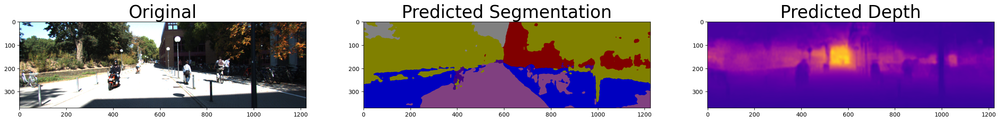

In [21]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,20))
ax1.imshow(img)
ax1.set_title('Original', fontsize=30)
ax2.imshow(segm)
ax2.set_title('Predicted Segmentation', fontsize=30)
ax3.imshow(depth, cmap="plasma", vmin=0, vmax=80)
ax3.set_title("Predicted Depth", fontsize=30)
plt.show()

## 3.4 — Run on a Video

In [22]:
print(img.shape)
print(depth.shape)
print(segm.shape)

(370, 1224, 3)
(370, 1224)
(370, 1224, 3)


(370, 1224, 3)


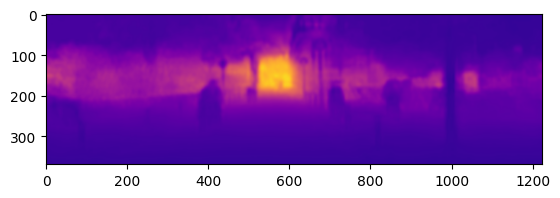

In [23]:
import matplotlib.cm as cm
import matplotlib.colors as co

def depth_to_rgb(depth):
    normalizer = co.Normalize(vmin=0, vmax=80)
    mapper = cm.ScalarMappable(norm=normalizer, cmap='plasma')
    colormapped_im = (mapper.to_rgba(depth)[:, :, :3] * 255).astype(np.uint8)
    return colormapped_im

depth_rgb = depth_to_rgb(depth)
print(depth_rgb.shape)
plt.imshow(depth_rgb)
plt.show()

(370, 1224, 3)
(370, 1224, 3)
(370, 1224, 3)


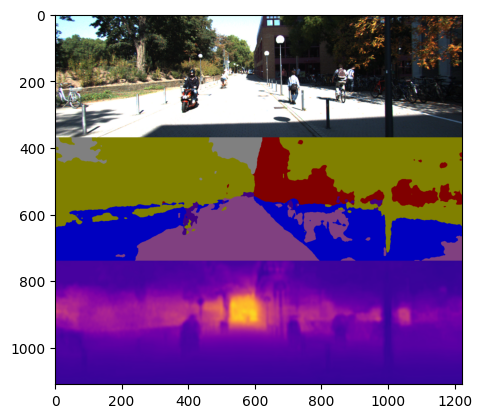

In [24]:
print(img.shape)
print(depth_rgb.shape)
print(segm.shape)
new_img = np.vstack((img, segm, depth_rgb))
plt.imshow(new_img)
plt.show()

In [25]:
video_files = sorted(glob.glob("data/*.png"))

# Build a HydraNet
hydranet = HydraNet()
hydranet.define_mobilenet()
hydranet.define_lightweight_refinenet()

# Set the Model to Eval on GPU
if torch.cuda.is_available():
    _ = hydranet.cuda()
_ = hydranet.eval()

# Load the Weights
ckpt = torch.load('ExpKITTI_joint.ckpt')
hydranet.load_state_dict(ckpt['state_dict'])

# Run the pipeline
result_video = []
for idx, img_path in enumerate(video_files):
    image = np.array(Image.open(img_path))
    h, w, _ = image.shape 
    depth, seg = pipeline(image)
    result_video.append(cv2.cvtColor(cv2.vconcat([image, seg, depth_to_rgb(depth)]), cv2.COLOR_BGR2RGB))

out = cv2.VideoWriter('output/out.mp4',cv2.VideoWriter_fourcc(*'MP4V'), 15, (w,3*h))

for i in range(len(result_video)):
    out.write(result_video[i])
out.release()

OpenCV: FFMPEG: tag 0x5634504d/'MP4V' is not supported with codec id 12 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x7634706d/'mp4v'


In [26]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open('output/out.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=800 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)